In [1]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

In [2]:
# GLOBAL PARAMs
fs = 48000. # sampling freq
path_to_data = Path("./outputs_16k/")

In [3]:
# LOAD RIRs

path_to_rirs_hdf = path_to_data / Path('dEchorate_rir.h5')
rir_dset = h5py.File(path_to_rirs_hdf, mode='r')

signals = list(rir_dset.keys())
print('Signals in this dataset:', signals)

rooms = list(rir_dset[signals[0]].keys())
print('Rooms in this dataset:', rooms)

sources = list(rir_dset[signals[0]][rooms[0]].keys())
print('Sources in this dataset:', sources)

print('RIR matrix shape', rir_dset[signals[0]][rooms[0]][sources[0]].shape)
print('31 mics = 30 mics + 1 control signals!')

Signals in this dataset: ['rir']
Rooms in this dataset: ['000000', '000001', '000010', '000100', '001000', '010000', '011000', '011100', '011110', '011111', '020002']
Sources in this dataset: ['0', '1', '2', '3', '4', '5', '6', '7', '8']
RIR matrix shape (48000, 31)
31 mics = 30 mics + 1 control signals!


In [4]:
# LOAD ANNOTATIONs

path_to_echo_h5 = path_to_data / Path('dEchorate_annotations.h5')
note_dset = h5py.File(path_to_echo_h5, 'r')
# let s check the content of this annotation dataset
for key in note_dset.keys():
    print(key)

arrays_direction
arrays_position
echo_amp
echo_toa
echo_wall
microphones
room_size
sources_directional_direction
sources_directional_position
sources_noise_direction
sources_noise_position
sources_omnidirection_position


(3, 4)
(3, 4)


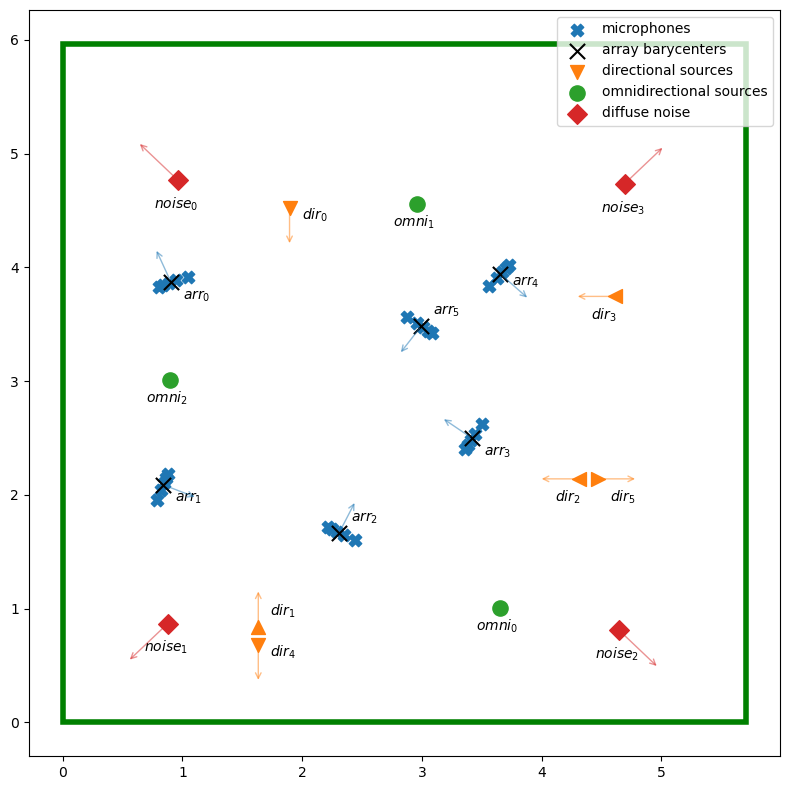

In [5]:
# DRAW GEOMETRY in 2D

room_size = note_dset['room_size'][()]
mics = note_dset['microphones'][()]
arrs = note_dset['arrays_position']
arrs_view = note_dset['arrays_direction']
srcs_dir = note_dset['sources_directional_position']
srcs_dir_view = note_dset['sources_directional_direction']
srcs_nse = note_dset['sources_noise_position']
srcs_nse_view = note_dset['sources_noise_direction']
srcs_omn = note_dset['sources_omnidirection_position']

m = { # marker type
    'arrs' : 'x',
    'mics' : 'X',
    'srcs_dir' : 'v',
    'srcs_omn' : 'o',
    'srcs_nse' : 'D',
}
s = { # marker size
    'arrs' : 120,
    'mics' : 80,
    'srcs_dir' : 100,
    'srcs_omn' : 120,
    'srcs_nse' : 100,
}
c = { # colors
    'arrs' : 'k',
    'mics' : 'C0',
    'srcs_dir' : 'C1',
    'srcs_omn' : 'C2',
    'srcs_nse' : 'C3',
}
l = { # labels
    'arrs' : 'array barycenters',
    'mics' : 'microphones',
    'srcs_dir' : 'directional sources',
    'srcs_omn' : 'omnidirectional sources',
    'srcs_nse' : 'diffuse noise',
}

plt.figure(figsize=(8,8))

# Plot ROOM
plt.gca().add_patch(
    plt.Rectangle((0, 0),
                room_size[0], room_size[1], fill=False,
                edgecolor='g', linewidth=4)
)

plt.scatter(mics[0, :], mics[1, :], marker=m['mics'], s=s['mics'], c=c['mics'], label=l['mics'])
plt.scatter(arrs[0, :], arrs[1, :], marker=m['arrs'], s=s['arrs'], c=c['arrs'], label=l['arrs'])

plt.text(arrs[0, 0]+0.1, arrs[1, 0]-0.15, '$arr_%d$' %0)
plt.text(arrs[0, 1]+0.1, arrs[1, 1]-0.15, '$arr_%d$' %1)
plt.text(arrs[0, 2]+0.1, arrs[1, 2]+0.10, '$arr_%d$' %2)
plt.text(arrs[0, 3]+0.1, arrs[1, 3]-0.15, '$arr_%d$' %3)
plt.text(arrs[0, 4]+0.1, arrs[1, 4]-0.1,  '$arr_%d$' %4)
plt.text(arrs[0, 5]+0.1, arrs[1, 5]+0.1,  '$arr_%d$' %5)

for a in range(arrs.shape[1]):
    x = arrs[0,a]
    y = arrs[1,a]
    dx = arrs_view[0,a] / 3
    dy = arrs_view[1,a] / 3
    plt.annotate("", xy=(x+dx,y+dy), xytext=(x, y), arrowprops=dict(arrowstyle="->", alpha=0.5, color=c['mics']))

# DIR
plt.scatter(srcs_dir[0, 0], srcs_dir[1, 0], marker='v', s=s['srcs_dir'], c=c['srcs_dir'], label=l['srcs_dir'])
plt.text(srcs_dir[0, 0]+0.1, srcs_dir[1, 0]-0.1, r'$dir_%d$' %0)
plt.text(srcs_dir[0, 1]+0.1, srcs_dir[1, 1]+0.1, r'$dir_%d$' %1)
plt.text(srcs_dir[0, 2]-0.2, srcs_dir[1, 2]-0.2, r'$dir_%d$' %2)
plt.text(srcs_dir[0, 3]-0.2, srcs_dir[1, 3]-0.2, r'$dir_%d$' %3)
plt.text(srcs_dir[0, 4]+0.1, srcs_dir[1, 4]-0.1, r'$dir_%d$' %4)
plt.text(srcs_dir[0, 5]+0.1, srcs_dir[1, 5]-0.2, r'$dir_%d$' %5)

for j in range(srcs_dir_view.shape[1]):
    x = srcs_dir[0,j]
    y = srcs_dir[1,j]
    dx = srcs_dir_view[0,j] / 3
    dy = srcs_dir_view[1,j] / 3
    plt.annotate("", xy=(x+dx,y+dy), xytext=(x, y), arrowprops=dict(arrowstyle="->", alpha=0.5, color=c['srcs_dir']))

# DIR
plt.scatter(srcs_dir[0, 1], srcs_dir[1, 1], marker='^', s=s['srcs_dir'], c=c['srcs_dir'])
plt.scatter(srcs_dir[0, 2], srcs_dir[1, 2], marker='<', s=s['srcs_dir'], c=c['srcs_dir'])
plt.scatter(srcs_dir[0, 3], srcs_dir[1, 3], marker='<', s=s['srcs_dir'], c=c['srcs_dir'])
plt.scatter(srcs_dir[0, 4], srcs_dir[1, 4], marker='v', s=s['srcs_dir'], c=c['srcs_dir'])
plt.scatter(srcs_dir[0, 5], srcs_dir[1, 5], marker='>', s=s['srcs_dir'], c=c['srcs_dir'])

# OMNI
plt.scatter(srcs_omn[0, :], srcs_omn[1, :], marker=m['srcs_omn'], s=s['srcs_omn'], c=c['srcs_omn'], label=l['srcs_omn'])
plt.text(srcs_omn[0, 0]-0.2, srcs_omn[1, 0]-0.2, r'$omni_%d$' %0)
plt.text(srcs_omn[0, 1]-0.2, srcs_omn[1, 1]-0.2, r'$omni_%d$' %1)
plt.text(srcs_omn[0, 2]-0.2, srcs_omn[1, 2]-0.2, r'$omni_%d$' %2)


# NOISE
plt.scatter(srcs_nse[0, :], srcs_nse[1, :], marker=m['srcs_nse'], s=s['srcs_nse'], c=c['srcs_nse'], label=l['srcs_nse'])
plt.text(srcs_nse[0, 0]-0.2, srcs_nse[1, 0]-0.25, r'$noise_%d$' %0)
plt.text(srcs_nse[0, 1]-0.2, srcs_nse[1, 1]-0.25, r'$noise_%d$' %1)
plt.text(srcs_nse[0, 2]-0.2, srcs_nse[1, 2]-0.25, r'$noise_%d$' %2)
plt.text(srcs_nse[0, 3]-0.2, srcs_nse[1, 3]-0.25, r'$noise_%d$' %3)
print(srcs_nse.shape)
print(srcs_nse_view.shape)
for j in range(srcs_nse_view.shape[1]):
    x = srcs_nse[0,j]
    y = srcs_nse[1,j]
    dx = srcs_nse_view[0,j] / 3
    dy = srcs_nse_view[1,j] / 3
    plt.annotate("", xy=(x+dx,y+dy), xytext=(x, y), arrowprops=dict(arrowstyle="->", alpha=0.5, color=c['srcs_nse']))

plt.legend()
plt.tight_layout()
plt.show()

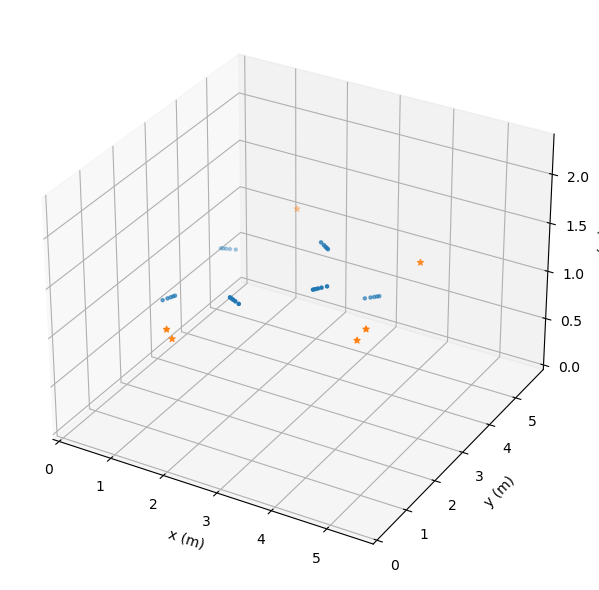

In [6]:
# DRAW GEOMTRY IN 3D

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter3D(mics[0,:], mics[1,:], mics[2,:], marker='.')
ax.scatter3D(srcs_dir[0,:], srcs_dir[1,:], srcs_dir[2,:], marker='*')
ax.set_xlim([0, room_size[0]])
ax.set_ylim([0, room_size[1]])
ax.set_zlim([0, room_size[2]])
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.set_zlabel("z (m)")
plt.tight_layout()
plt.show()

Text(0, 0.5, 'RIR [Amplitube]')

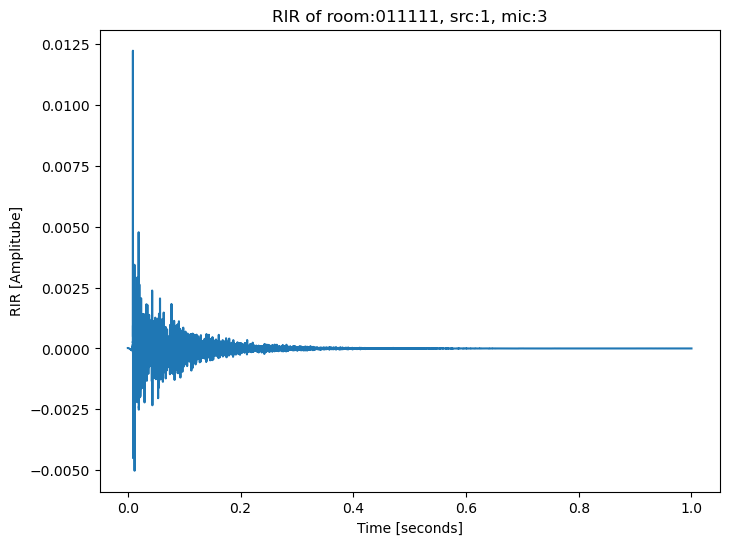

In [7]:
# Plot a RIR
signal = 'rir'
room = '011111'
src = 1
mic = 3
rir = rir_dset['rir']['011111'][str(src)][()][:,mic]

L = rir.shape[0]
time = np.arange(L)/fs

plt.figure(figsize=(8,6))
plt.title(f'RIR of room:{room}, src:{src}, mic:{mic}')
plt.plot(time, rir)
plt.xlabel('Time [seconds]')
plt.ylabel('RIR [Amplitube]')

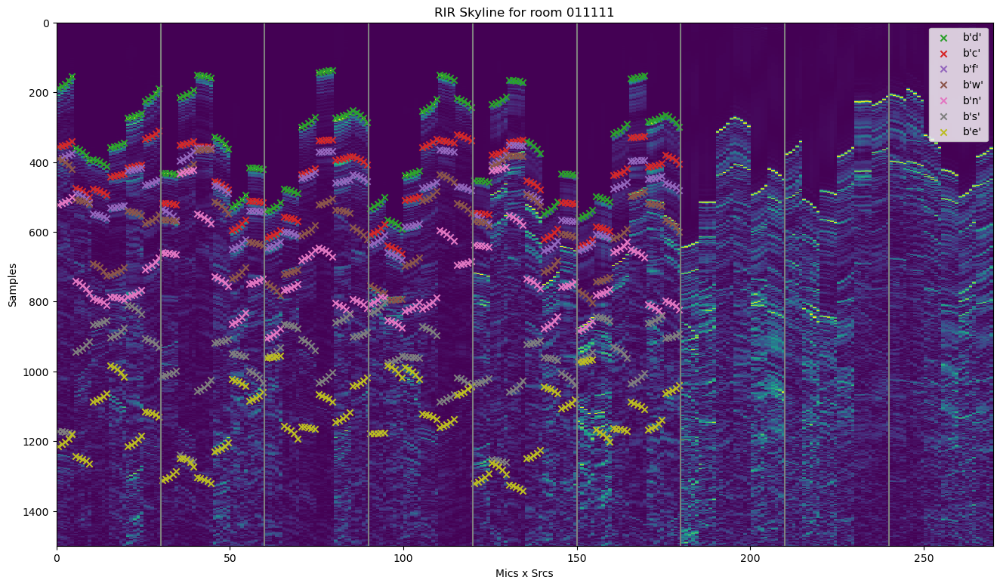

In [8]:
# PLOT RIR SKYLINEs

echo_toa = note_dset['echo_toa']
echo_wall = note_dset['echo_wall']

room = '011111'
rirs = np.stack([rir_dset['rir'][room][s][()] for s in sources], axis=1)
rirs = rirs[:,:,:-1] # do not use the loopback signal
n_smpl, n_srcs, n_mics = rirs.shape

L = 1500 # visualize on the first L samples

to_plot = rirs.transpose([0,1,2]).reshape([n_smpl,n_srcs*n_mics])
to_plot = to_plot / np.max(np.abs(to_plot), axis=0, keepdims=True)
to_plot = np.abs(to_plot)[:L,:]


plt.figure(figsize=(16,9))
plt.title(f'RIR Skyline for room {room}')
plt.imshow(to_plot, extent=[0, n_mics*n_srcs, L, 0], aspect='auto', interpolation='none', origin='upper')

# plot srcs boundaries
for j in range(n_srcs):
    plt.axvline(j*n_mics, color='C7')
    
# plot peak annotation
for k in range(echo_toa.shape[0]):
    plt.scatter(np.arange(n_mics*6)+0.5, echo_toa[k, :, :].T.flatten()*fs, 
                c='C%d' % (k+2), marker='x', label='%s' % str(echo_wall[k,0,0]))

plt.xlim([0, n_mics * n_srcs])
plt.ylabel("Samples")
plt.xlabel("Mics x Srcs")
plt.legend()
plt.show()

In [9]:
def normalize(x):
    return x / np.max(np.abs(x), axis=0, keepdims=True)

000000 speech (416427, 9, 31) 16000
(3, 104000, 9, 31)


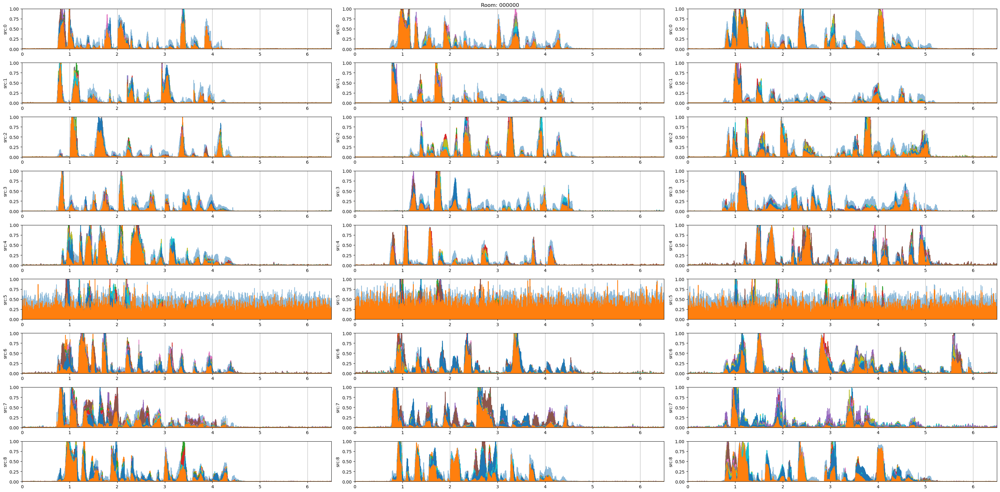

ZeroDivisionError: division by zero

In [19]:
signal = 'speech'
path_h5 = path_to_data / Path(f'dEchorate_{signal}.h5')
dset = h5py.File(path_h5, mode='r')

for room in rooms:
    data = np.stack([dset[signal][room][src][()] for src in dset[signal][room].keys()], axis=1)
    
    fs = dset.attrs['sampling_rate']
    print(room, signal, data.shape, fs)
    time = np.arange(data.shape[0]) / fs
    
    L, J, I = data.shape
    
    # regions = [1.5, 9.5, 17.5]
    # span = 6.5

    # fig, axarr = plt.subplots(J, 1, figsize=(32,16))
    # for j in range(J):
    #     for r in regions:
    #         axarr[j].axvspan(r, r+span, color="magenta", alpha=0.2)
    #     axarr[j].plot(time, normalize(data[:,j,-1]), label="Loopback", alpha=0.5)
    #     axarr[j].plot(time, normalize(data[:,j, :])**2, label="Recorded")
    #     axarr[j].set_ylabel(f"src:{j}")
    #     axarr[j].grid(axis = 'x')
    #     axarr[j].xaxis.set_ticks(np.arange(0,26,1))
    #     axarr[j].set_ylim(0,1)
    #     axarr[j].set_xlim(0,26)
    # plt.suptitle(f"Room: {room}")
    # plt.tight_layout()
    # plt.savefig(f'{room}_{signal}_all_mics_srcs.png')
    # plt.show()
    # plt.close()
    
    l = 6.5
    data = np.stack([data[int(s*fs):int((s+l)*fs),:] for s in [1.5, 9.5, 17.5]], axis=0)
    print(data.shape)
    assert data.shape[0] == 3
    assert data.shape[1] == l*fs
    assert data.shape[2] == J
    assert data.shape[3] == I
    
    time = np.arange(data.shape[1]) / fs
    
    fig, axarr = plt.subplots(J, 3, figsize=(32,16))
    for j in range(J):
        for r in range(3):
            axarr[j,r].plot(time, normalize(data[r,:,j,-1]), label="Loopback", alpha=0.5)
            axarr[j,r].plot(time, normalize(data[r,:,j, :])**2, label="Recorded")
            axarr[j,r].set_ylabel(f"src:{j}")
            axarr[j,r].grid(axis = 'x')
            axarr[j,r].xaxis.set_ticks(np.arange(0,6.5,1))
            axarr[j,r].set_ylim(0,1)
            axarr[j,r].set_xlim(0,6.5)
            
    plt.suptitle(f"Room: {room}")
    plt.tight_layout()
    plt.savefig(f'{room}_{signal}_all_mics_srcs.png')
    plt.show()
    plt.close()
dset.close()

In [29]:
signal = 'speech'
path_h5 = path_to_data / Path(f'dEchorate_{signal}.h5')
dset = h5py.File(path_h5, mode='r')

for room in rooms:
    data = np.stack([dset[signal][room][src][()] for src in dset[signal][room].keys()], axis=1)
    
    fs = dset.attrs['sampling_rate']
    print(room, signal, data.shape, fs)
    time = np.arange(data.shape[0]) / fs
    
    L, J, I = data.shape
    l = 6.5
    data = np.stack([data[int(s*fs):int((s+l)*fs),:] for s in [1.5, 9.5, 17.5]], axis=0)
    assert data.shape[0] == 3
    assert data.shape[1] == l*fs
    assert data.shape[2] == J
    assert data.shape[3] == I
    
    for i in range(I):
        for j in range(J):
                
            _data = data[0,:,j,i] / np.max(np.abs(data[0,:,j,i]))
            _data = _data[5*fs:]**2
            m = np.mean(_data)
            if m > 0.03:
                print(room, j, i, m)
    
dset.close()

000000 speech (416427, 9, 31) 16000
000000 5 30 0.044008368055405984
000001 speech (416427, 9, 31) 16000
000010 speech (416427, 9, 31) 16000
000100 speech (416427, 9, 31) 16000
001000 speech (416427, 9, 31) 16000
010000 speech (416427, 9, 31) 16000
010000 0 30 0.04670826922138598
010000 1 30 0.04190029809730853
010000 2 30 0.038190692426263495
010000 3 30 0.04997717212595349
010000 4 30 0.0424002813813919
010000 5 30 0.04832750967506748
011000 speech (416427, 9, 31) 16000
011000 3 30 0.052280610628891264
011000 4 30 0.04782070339309859
011000 5 30 0.04605856803120529
011100 speech (416427, 9, 31) 16000
011100 3 30 0.0512717806601806
011100 4 30 0.05218782289046455
011100 5 30 0.039786163527639154
011110 speech (416427, 9, 31) 16000
011110 3 30 0.046644401113832896
011110 4 30 0.05181710931968577
011110 5 30 0.05048170009824475
011111 speech (416427, 9, 31) 16000
011111 3 30 0.053469553536400594
011111 4 30 0.04900162012893457
011111 5 30 0.039462441519328074
020002 speech (416427, 9, 3

000000 noise (225280, 9, 31) 16000


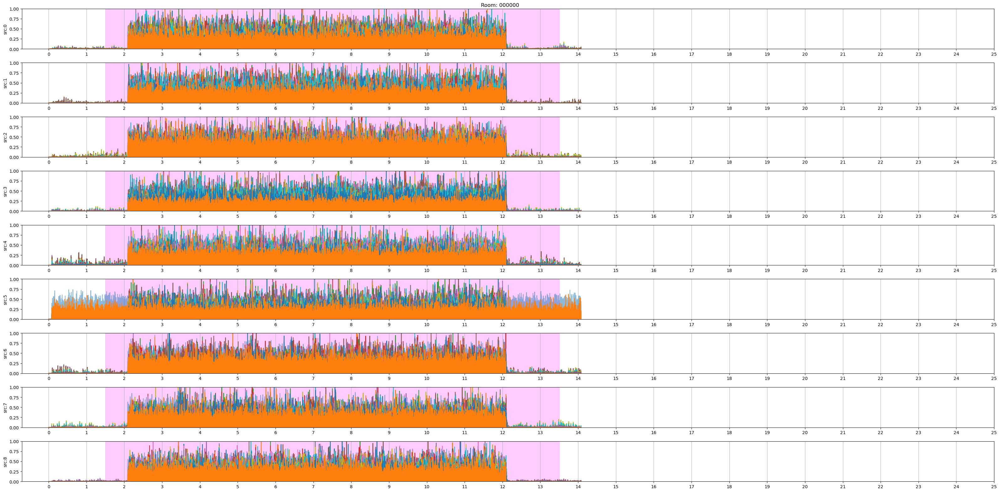

000001 noise (225280, 9, 31) 16000


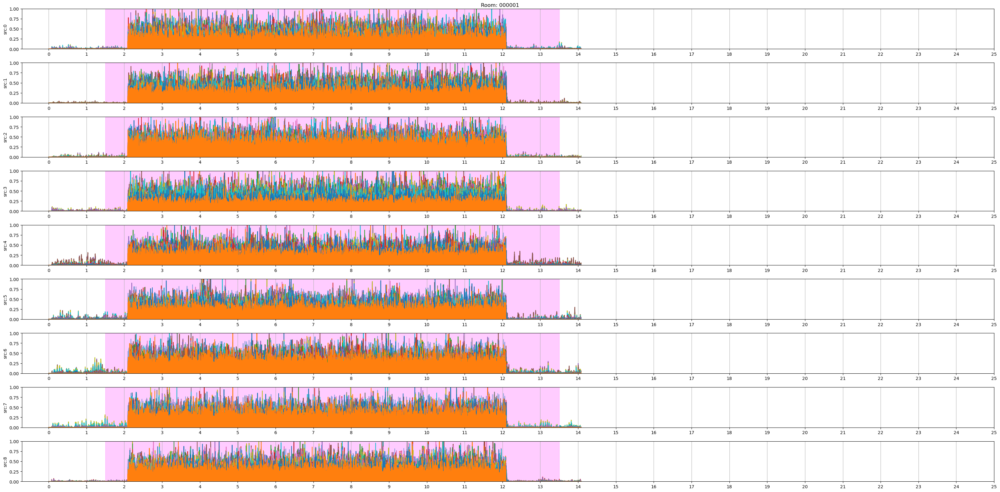

000010 noise (225280, 9, 31) 16000


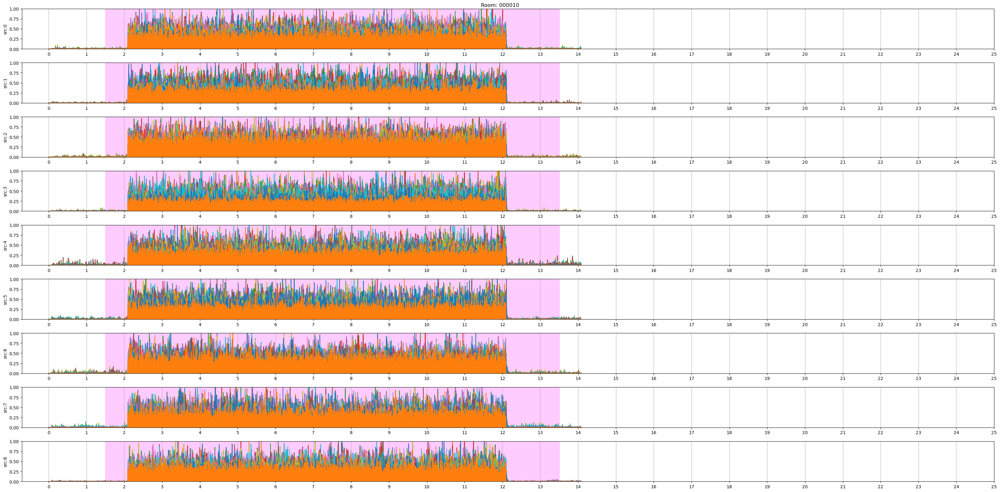

000100 noise (225280, 9, 31) 16000


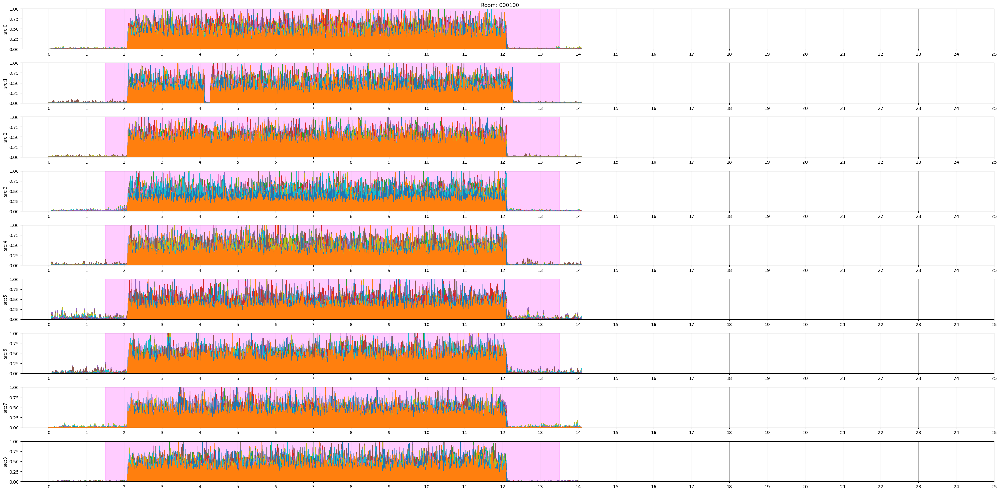

001000 noise (225280, 9, 31) 16000


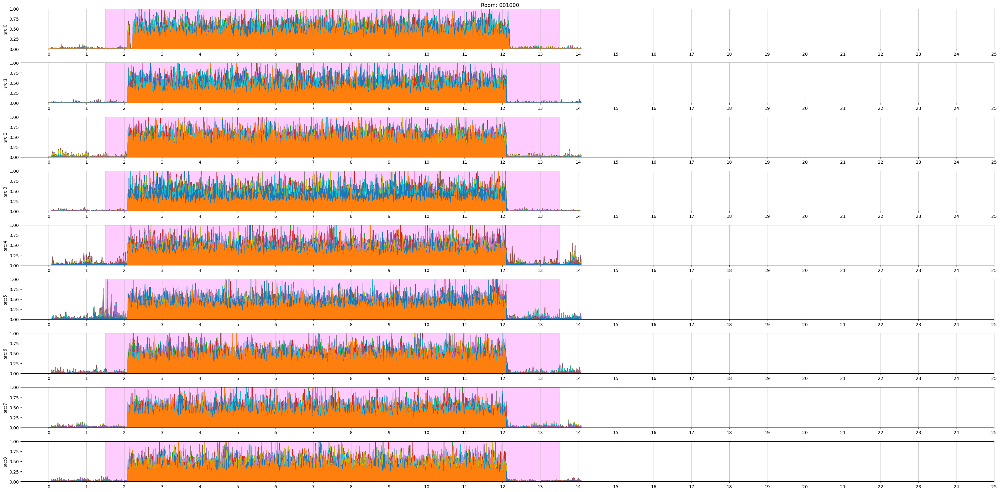

010000 noise (225280, 9, 31) 16000


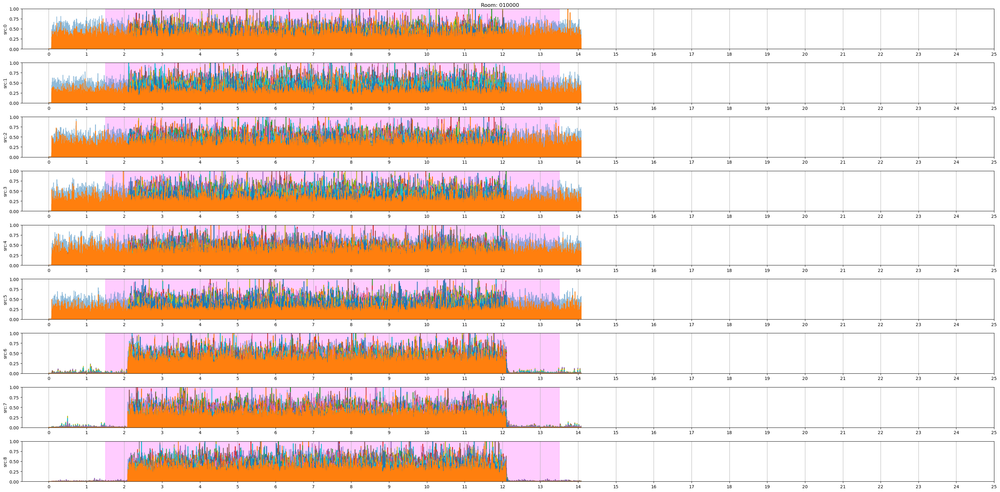

011000 noise (225280, 9, 31) 16000


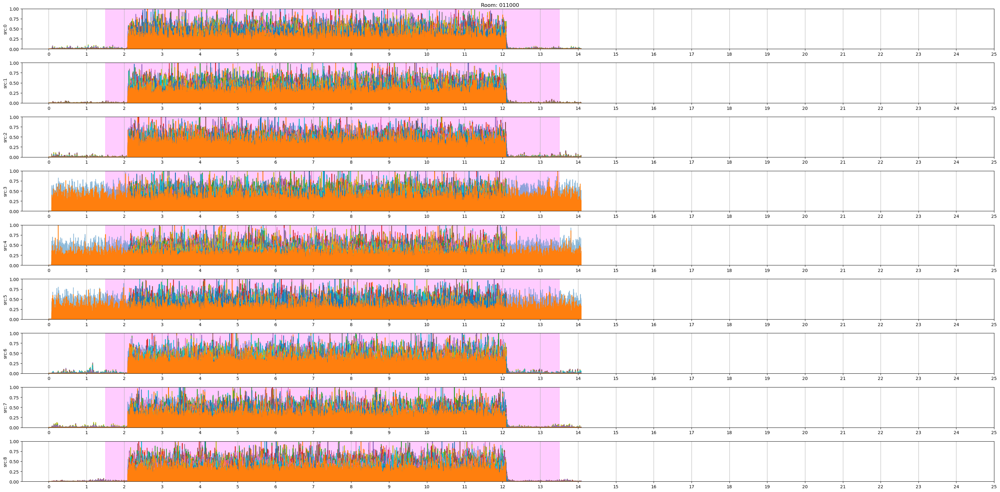

011100 noise (225280, 9, 31) 16000


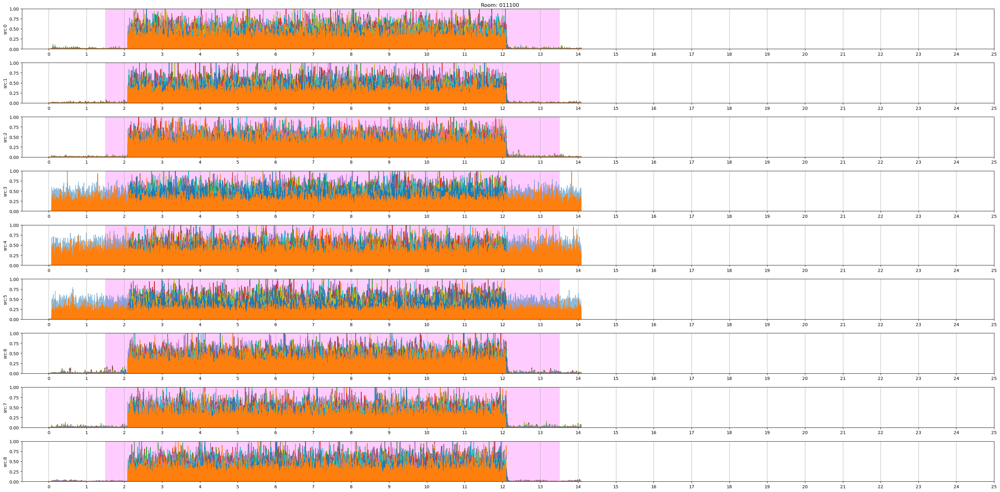

011110 noise (225280, 9, 31) 16000


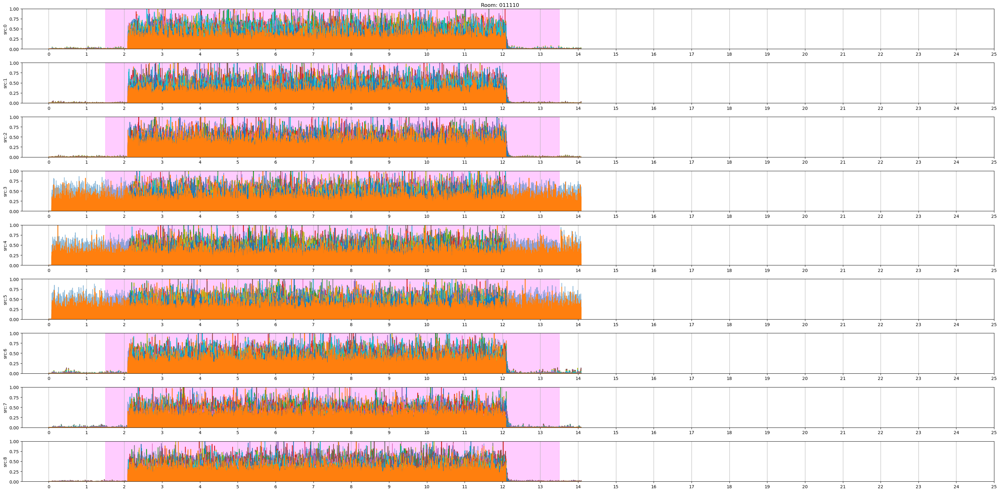

011111 noise (225280, 9, 31) 16000


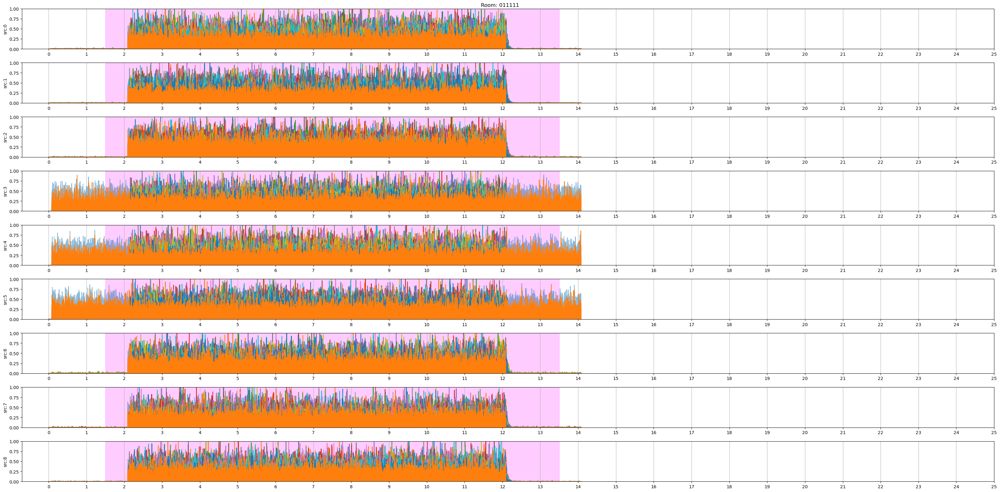

020002 noise (225280, 9, 31) 16000


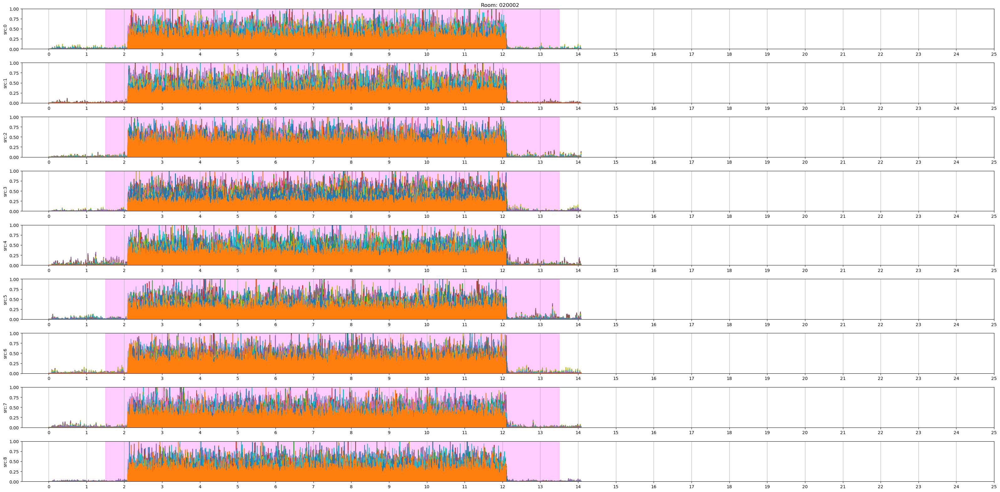

In [11]:
signal = 'noise'
path_h5 = path_to_data / Path(f'dEchorate_{signal}.h5')
dset = h5py.File(path_h5, mode='r')

for room in rooms:
    data = np.stack([dset[signal][room][src][()] for src in dset[signal][room].keys()], axis=1)
    fs = dset.attrs['sampling_rate']
    print(room, signal, data.shape, fs)
    time = np.arange(data.shape[0]) / fs
    
    L, J, I = data.shape
    
